关于Tushare数据:

open: 开盘价(元/股)  
high: 最高价  
low: 最低价  
close: 收盘价  
pre_close: 昨收盘价(前复权)  
vol: 成交量(手)  
amount: 成交金额(千元)  
mean_price: 当日成交均价

In [1]:
import pandas as pd
import scutquant.scutquant as q

df = pd.read_csv("D:/Desktop/data.csv")
df["datetime"] = pd.to_datetime(df["datetime"])
df["mean_price"] = df["amount"] / df["vol"] * 10  # 每支股票在当天的交易均价
df

,datetime,ts_code,open,high,low,close,pre_close,change,pct_chg,vol,amount,mean_price
0,2006-01-04,000001.SZ,6.13,6.33,6.12,6.28,6.14,0.14,2.2800,154450.68,96989.0066,6.279610
1,2006-01-04,000002.SZ,4.40,4.67,4.40,4.66,4.31,0.35,8.1200,389310.43,175187.0657,4.499933
2,2006-01-04,000012.SZ,4.70,4.75,4.55,4.70,4.62,0.08,1.7300,40399.61,18863.8625,4.669318
3,2006-01-04,000016.SZ,3.52,3.58,3.52,3.57,3.52,0.05,1.4200,14426.65,5131.8793,3.557222
4,2006-01-04,000021.SZ,7.99,8.40,7.99,8.32,8.00,0.32,4.0000,33526.60,27657.1708,8.249322
...,...,...,...,...,...,...,...,...,...,...,...,...
1199440,2022-12-30,688363.SH,136.00,137.00,131.50,135.28,135.49,-0.21,-0.1550,29951.60,401624.1560,134.091052
1199441,2022-12-30,688396.SH,53.06,53.40,52.49,52.65,52.87,-0.22,-0.4161,23401.54,123568.2880,52.803486
1199442,2022-12-30,688561.SH,65.49,67.88,64.85,65.77,65.46,0.31,0.4736,22567.89,149379.0770,66.190981
1199443,2022-12-30,688599.SH,63.31,64.56,62.31,63.76,63.20,0.56,0.8861,109144.36,695759.9350,63.746760


In [2]:
df.set_index(["datetime", "ts_code"], inplace=True)
df.index.names = ["datetime", "instrument"]

interest_data = pd.read_csv("D:/Desktop/capm.csv")
interest_data["RF"] = interest_data["RF"].shift(1).fillna(method="bfill") # 能对T时刻数据产生影响的，当为T-1的RF

print("Joining data, please wait...")
df = q.join_data(df, interest_data, col=["RF", "MKT"])

print("Making i factors...")
df["i1"] = df["pct_chg"] / df["RF"]  # (df["pct_chg"] / df["MKT"]) / (df["RF"] / df["MKT"])
#df["i2"] = df["pct_chg"] / df["MKT"] # 思路与上面相似
#df["i3"] = (df["pct_chg"] + df["RF"]) / (2 * df["MKT"]) # pct_chg和RF的均值 与市场收益率之比
#df["i4"] = 2 * df["pct_chg"] / (df["RF"] + df["MKT"]) # 将全部资金投资股票的收益率, 与将资金按1：1投资国债和市场组合的收益之比
#df["i5"] = (df["pct_chg"] - df["RF"]) / df["MKT"] 

df["i6"] = df["close"] / (df["close"].groupby("instrument").mean() * df["RF"])
df["i7"] = df["close"] / (df["close"].groupby("instrument").std() * df["RF"])
df["i8"] = (df["high"] - df["low"]) / (2 * df["RF"] * df["close"])
df["i9"] = df["vol"] / (df["vol"].groupby("instrument").mean() * df["RF"])
df["i10"] = df["vol"] / (df["vol"].groupby("instrument").std() * df["RF"])

print(df["open"].groupby("datetime").count())
df.info()

Joining data, please wait...
Making i factors...
datetime
2006-01-04    264
2006-01-05    267
2006-01-06    272
2006-01-09    269
2006-01-10    267
             ... 
2022-12-26    300
2022-12-27    300
2022-12-28    300
2022-12-29    300
2022-12-30    300
Name: open, Length: 4132, dtype: int64
<class 'pandas.core.frame.DataFrame'>
MultiIndex: 1199445 entries, (Timestamp('2006-01-04 00:00:00'), '000001.SZ') to (Timestamp('2022-12-30 00:00:00'), '688981.SH')
Data columns (total 18 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   open        1199445 non-null  float64
 1   high        1199445 non-null  float64
 2   low         1199445 non-null  float64
 3   close       1199445 non-null  float64
 4   pre_close   1199445 non-null  float64
 5   change      1199445 non-null  float64
 6   pct_chg     1199445 non-null  float64
 7   vol         1199445 non-null  float64
 8   amount      1199445 non-null  float64
 9   mean_price  1199445 non-null

构建目标值，使用pct$\_$chg(即收盘价的变化率)的滞后-2阶项(相当于T+2对T+1的收盘价变化率)除以100 作为目标值，并按照涨跌停限制(-10$\%$, 10$\%$)截断

In [3]:
df["label"] = df["pct_chg"].groupby("instrument").shift(-2) / 100
df = df.dropna()
df["label"].clip(-0.1, 0.1, inplace=True) 
df["label"].describe()

count    1.197673e+06
mean     5.829445e-04
std      2.843395e-02
min     -1.000000e-01
25%     -1.330000e-02
50%      0.000000e+00
75%      1.370000e-02
max      1.000000e-01
Name: label, dtype: float64

查看原始数据之间的相关关系, 发现利率因子的相关系数(pearson相关系数和spearman相关系数)比较高

In [4]:
df = df.drop(["pct_chg", "change", "pre_close", "RF", "MKT"], axis=1)
df.corr()

,open,high,low,close,vol,amount,mean_price,i1,i6,i7,i8,i9,i10,label
open,1.000000,0.999825,0.999831,0.999663,-0.074657,0.277427,0.999812,0.000398,0.202408,0.060761,0.030529,-0.003668,0.064045,-0.005175
high,0.999825,1.000000,0.999769,0.999862,-0.074264,0.279842,0.999930,0.005715,0.203397,0.061181,0.034546,-0.001921,0.066403,-0.005246
low,0.999831,0.999769,1.000000,0.999838,-0.074679,0.275917,0.999923,0.004937,0.201853,0.060527,0.027061,-0.004361,0.062864,-0.005177
close,0.999663,0.999862,0.999838,1.000000,-0.074348,0.278155,0.999946,0.010109,0.202895,0.060956,0.031082,-0.002807,0.065016,-0.005471
vol,-0.074657,-0.074264,-0.074679,-0.074348,1.000000,0.607239,-0.074416,0.076687,0.052905,0.057366,0.180531,0.518415,0.391997,-0.000709
amount,0.277427,0.279842,0.275917,0.278155,0.607239,1.000000,0.278044,0.084353,0.240518,0.104144,0.264099,0.517958,0.497746,-0.008528
mean_price,0.999812,0.999930,0.999923,0.999946,-0.074416,0.278044,1.000000,0.006768,0.202745,0.060893,0.031048,-0.002979,0.064812,-0.005219
i1,0.000398,0.005715,0.004937,0.010109,0.076687,0.084353,0.006768,1.000000,0.037143,0.022035,0.069946,0.156980,0.158663,-0.015204
i6,0.202408,0.203397,0.201853,0.202895,0.052905,0.240518,0.202745,0.037143,1.000000,0.639964,0.379849,0.265226,0.284231,-0.026986
i7,0.060761,0.061181,0.060527,0.060956,0.057366,0.104144,0.060893,0.022035,0.639964,1.000000,0.226098,0.210485,0.265045,-0.022013


In [5]:
df.corr(method="spearman")

,open,high,low,close,vol,amount,mean_price,i1,i6,i7,i8,i9,i10,label
open,1.000000,0.999726,0.999759,0.999502,-0.299444,0.381984,0.999765,-0.006741,0.354330,0.265586,0.187314,0.078536,0.184432,-0.015185
high,0.999726,1.000000,0.999611,0.999773,-0.295026,0.386481,0.999903,0.006444,0.353805,0.264505,0.196748,0.083422,0.189366,-0.015217
low,0.999759,0.999611,1.000000,0.999732,-0.300672,0.380781,0.999864,0.004583,0.355189,0.266821,0.179330,0.077141,0.182872,-0.015581
close,0.999502,0.999773,0.999732,1.000000,-0.297030,0.384441,0.999890,0.017296,0.354623,0.265704,0.188371,0.081267,0.187097,-0.016174
vol,-0.299444,-0.295026,-0.300672,-0.297030,1.000000,0.722123,-0.297402,0.078427,0.072572,0.036666,0.186739,0.598820,0.498202,-0.007272
amount,0.381984,0.386481,0.380781,0.384441,0.722123,1.000000,0.384138,0.083054,0.292637,0.211142,0.298906,0.631674,0.620776,-0.017903
mean_price,0.999765,0.999903,0.999864,0.999890,-0.297402,0.384138,1.000000,0.008566,0.354555,0.265657,0.188839,0.080825,0.186662,-0.015425
i1,-0.006741,0.006444,0.004583,0.017296,0.078427,0.083054,0.008566,1.000000,0.012770,0.006983,0.035547,0.094975,0.092339,-0.031948
i6,0.354330,0.353805,0.355189,0.354623,0.072572,0.292637,0.354555,0.012770,1.000000,0.810289,0.446157,0.338377,0.302675,-0.029055
i7,0.265586,0.264505,0.266821,0.265704,0.036666,0.211142,0.265657,0.006983,0.810289,1.000000,0.285129,0.267523,0.273973,-0.027275


使用label在截面上的平均值构建等权指数，查看股票在时序上的总体变化

<AxesSubplot:xlabel='datetime'>

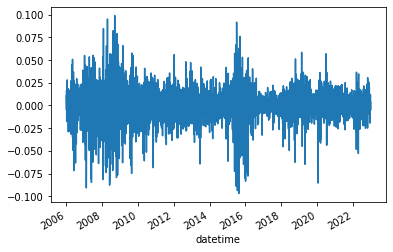

In [6]:
index = pd.DataFrame({"index": df["label"].groupby("datetime").mean()})
index["index"].plot()

In [7]:
index["index"].describe()

count    4130.000000
mean        0.000607
std         0.018247
min        -0.096926
25%        -0.007113
50%         0.000959
75%         0.009797
max         0.098993
Name: index, dtype: float64

对指数进行时间序列分析，结果表明收益率可能存在一定的自相关性(周期性), 但趋势和季节性不明显

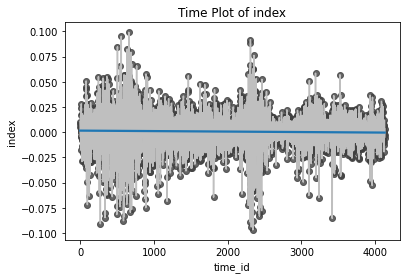

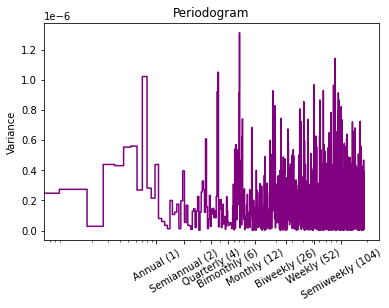

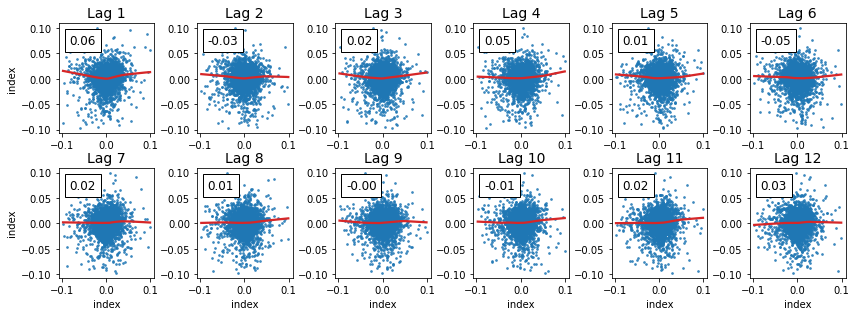

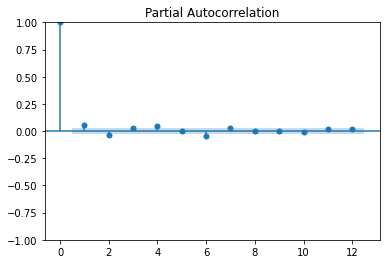

In [8]:
index = pd.DataFrame({"index": df["label"].groupby("datetime").mean()})
q.auto_ts_ana(index, "index", "day", windows=5, lags=12)

使用alpha模块构建因子 (make_factors是构建技术面因子；alpha360是原始数据的滞后项去除单位)

In [9]:
from scutquant import alpha

kwargs = {
    "data": df,
    "open": "open",
    "close": "close",
    "high": "high",
    "low": "low",
    "volume": "vol",
    "amount": "amount",
    "groupby": "instrument"
}
X = alpha.alpha360(kwargs=kwargs)
#X = alpha.make_factors(kwargs=kwargs, raw_data=0)

X = pd.concat([X, df[["label", "i1", "i6", "i7", "i8", "i9", "i10"]]], axis=1)
X = X.dropna()
X

open1     open2     open3     open4     open5  \
datetime   instrument                                                     
2006-04-07 000001.SZ   1.024730  1.015456  0.990726  0.976816  0.973725   
           000002.SZ   1.023426  0.995608  1.010249  0.959004  0.951684   
           000059.SZ   0.955711  0.960373  0.958042  0.930070  0.923077   
           000061.SZ   0.876122  0.829443  0.829443  0.800718  0.804309   
           000063.SZ   1.013342  0.987929  1.012706  0.972363  0.959339   
...                         ...       ...       ...       ...       ...   
2022-12-28 688363.SH   0.963159  0.955070  0.951026  0.914111  0.904552   
           688396.SH   0.999434  0.990377  1.000000  1.015094  1.023019   
           688561.SH   1.024219  1.031379  0.938157  0.938309  0.941356   
           688599.SH   0.942443  0.863839  0.873565  0.858099  0.874043   
           688981.SH   1.011980  1.000000  1.000000  1.015892  1.020293   

                          open6     open7     open8     open9    open10  ...  \
datetime   instrument                                                    ...   
2006-04-07 000001.SZ   1.003091  0.989181  0.981453  0.975270  0.989181  ...   
           000002.SZ   0.966325  0.959004  0.913616  0.868228  0.878477  ...   
           000059.SZ   0.932401  0.951049  0.953380  0.934732  0.946387  ...   
           000061.SZ   0.825853  0.798923  0.771993  0.777379  0.789946  ...   
           000063.SZ   0.945044  0.930432  0.932338  0.927573  0.921220  ...   
...                         ...       ...       ...       ...       ...  ...   
2022-12-28 688363.SH   0.919921  0.941246  0.932642  0.956688  0.919185  ...   
           688396.SH   1.024717  1.074528  1.065660  1.068679  1.107547  ...   
           688561.SH   0.974867  0.982635  1.002285  0.990251  0.967251  ...   
           688599.SH   0.882175  0.872449  0.883291  0.876276  0.893973  ...   
           688981.SH   1.016626  1.046455  1.039120  1.038142  1.074817  ...   

                       amount58  amount59  amount60     label            i1  \
datetime   instrument                                                         
2006-04-07 000001.SZ   0.198515  0.125080  0.125308  0.026700  -4230.769231   
           000002.SZ   0.059178  0.054714  0.049890  0.025300 -11043.956044   
           000059.SZ   0.142202  0.058425  0.019139 -0.020700  17197.802198   
           000061.SZ   0.029542  0.020071  0.046194 -0.001800  20439.560440   
           000063.SZ   0.054851  0.046420  0.059121 -0.007900 -21318.681319   
...                         ...       ...       ...       ...           ...   
2022-12-28 688363.SH   0.032411  0.042411  0.042831 -0.001550  -9662.666667   
           688396.SH   0.183622  0.158856  0.164713 -0.004161  -9180.000000   
           688561.SH   0.063439  0.081799  0.104741  0.004736 -14309.333333   
           688599.SH   0.070434  0.057827  0.057153  0.008861  26640.000000   
           688981.SH   0.091555  0.100307  0.087161  0.006114  -9322.000000   

                                i6            i7          i8           i9  \
datetime   instrument                                                       
2006-04-07 000001.SZ   2290.592442   5498.275542   63.692104   913.353208   
           000002.SZ   2233.846926   4322.296476  120.669960  2969.223838   
           000059.SZ   2842.579407   7642.627966  108.865493  3743.952974   
           000061.SZ   2269.700181   5344.324299  187.424783  5932.382096   
           000063.SZ   6246.888508  13484.902787  163.194493  1301.867887   
...                            ...           ...         ...          ...   
2022-12-28 688363.SH   5964.828784  21380.333166  117.410594  8597.267933   
           688396.SH   5792.633578  29911.460522   56.603774  1315.127701   
           688561.SH   7493.457941  39262.717088  192.942371  4381.258175   
           688599.SH   6373.088194  50093.636972  193.452381  6064.335676   
           688981.SH   6245.687461  64253.035931   51.344

划分训练集，验证集和测试集(测试集时间为2019年1月1月-2022年12月28日), 训练集和验证集在剩余数据中按7:3的比例随机拆分；  
分离因子和目标值；  
对因子(和目标值)按截面分别进行标准化处理(ZScoreNorm)，并使用三倍标准差法截断异常值；  
按照股票代码，使用ffill方法填充因子缺失值，并去除剩余缺失值；并使目标值的index与因子相匹配

注: 由于直接对目标值按截面进行标准化可能在回测时引起数据窥探，故对目标值进行标准化时，使用滞后2阶的均值和标准差, 并以年化5$\%$和年化30$\%$填充缺失值

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 863009 entries, (Timestamp('2006-04-07 00:00:00'), '000001.SZ') to (Timestamp('2018-12-28 00:00:00'), '603993.SH')
Columns: 367 entries, open1 to i10
dtypes: float64(367)
memory usage: 2.4+ GB
None
X_mis= 0.0
clean dataset done 

split data done 

label norm done 



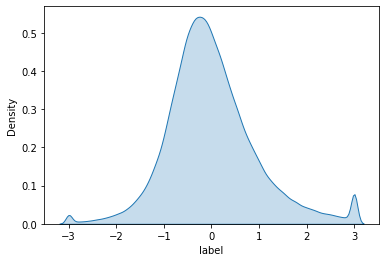

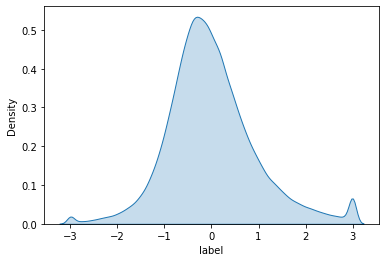

norm data done 

all works done 



In [10]:
X_train = X[X.index.get_level_values(0) <= "2018-12-31"]
X_test = X[X.index.get_level_values(0) >= "2019-01-01"]

# 处理训练集和验证集
result = q.auto_process(X_train, "label", groupby="instrument", datetime="datetime", 
                        split_params={"method": "split", "params": {"test": 0.3}}, select=False, orth=False)

X_train, y_train, X_valid, y_valid = result["X_train"], result["y_train"], result["X_test"], result["y_test"]

# 处理测试集
y_test = X_test.pop("label")
x_mean, x_std = X_test.groupby("datetime").mean(), X_test.groupby("datetime").std()
X_test = q.zscorenorm(X_test, x_mean, x_std)

y_mean = y_test.groupby("instrument").shift(2).groupby("datetime").mean()
y_std = y_test.groupby("instrument").shift(2).groupby("datetime").std()
y_mean.fillna(0.0002, inplace=True)  # 假设年化5%, 则每天应为0.0002
y_std.fillna(0.0189, inplace=True)  # 假设年化波动率为30%, 即0.3, 则每天的波动率应为0.0189

X_test = X_test.groupby("instrument").fillna(method="ffill").dropna()
y_test = y_test[y_test.index.isin(X_test.index)]

查看X_train的分布

In [11]:
X_train.describe()

,open1,open2,open3,open4,open5,open6,open7,open8,open9,open10,...,amount57,amount58,amount59,amount60,i1,i6,i7,i8,i9,i10
count,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,...,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000
mean,-0.001886,-0.006017,-0.008671,-0.010522,-0.012149,-0.013371,-0.014311,-0.015032,-0.015638,-0.016248,...,-0.029017,-0.029140,-0.029197,-0.029305,-0.008024,-0.010718,-0.013195,-0.012446,-0.027122,-0.024741
std,0.922246,0.903282,0.890462,0.883067,0.877944,0.873692,0.871871,0.871285,0.870522,0.869565,...,0.844785,0.844120,0.843787,0.842986,0.941648,0.955109,0.940258,0.947594,0.865442,0.881821
min,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,...,-2.255692,-2.027422,-1.892921,-1.852144,-3.000000,-2.799082,-3.000000,-3.000000,-2.041656,-2.440214
25%,-0.477078,-0.466828,-0.463300,-0.460420,-0.461849,-0.461600,-0.463968,-0.467283,-0.469881,-0.471297,...,-0.587955,-0.586800,-0.584746,-0.585379,-0.585882,-0.673654,-0.677106,-0.682224,-0.604672,-0.629255
50%,0.044340,0.029382,0.022633,0.015661,0.009684,0.005715,0.001505,-0.002910,-0.005429,-0.009716,...,-0.228473,-0.229956,-0.230185,-0.230280,-0.108630,-0.134216,-0.166069,-0.210460,-0.248954,-0.253808
75%,0.539813,0.508523,0.489593,0.478851,0.469578,0.463673,0.459752,0.456898,0.453732,0.451162,...,0.272595,0.271687,0.269739,0.271020,0.470166,0.512670,0.494023,0.462221,0.301968,0.330274
max,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,...,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000


下面进行特征分析，每一列子图有四行，含义分别为:  

(1) 特征整体的分布  
(2) 随着时间变化，特征的均值和方差  
(3) 随着时间变化，特征每天的 unique value占当天总股票数量的比例（用于统计特征是数值特征还是类别特征）  
(4) 特征的自相关性 (1 lag)

结论:    
(1)随着滞后阶数的提升, 特征的自相关性变高  
(2)除了label特征外，其余特征均为数值特征(unique value占比都较高)  
(3)随着时间变化，label特征在categorical feature和numerical feature之间变化  
(4)特征处理可以改进(目前特征均值和方差随时间变化比较剧烈)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:   13.3s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed:   21.4s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:   24.4s
[Parallel(n_jobs=-1)]: Done 113 tasks      | elapsed:   27.9s
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:   31.1s
[Parallel(n_jobs=-1)]: Done 149 tasks      | elapsed:   34.7s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:   38.8s
[Parallel(n_jobs=-1)]: Done 189 tasks      | elapsed:   43.5s
[Parallel(n_jobs=-1)]: Done 210 tasks      | elapsed:   47.4s
[Parallel(n_jobs=-1)]: Done 233 tasks      | elapsed:  

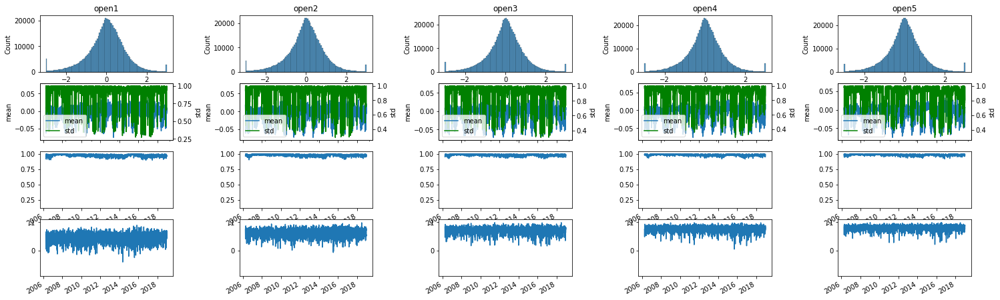

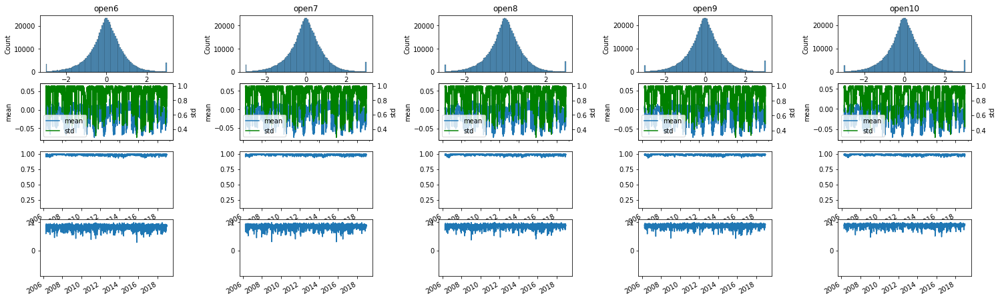

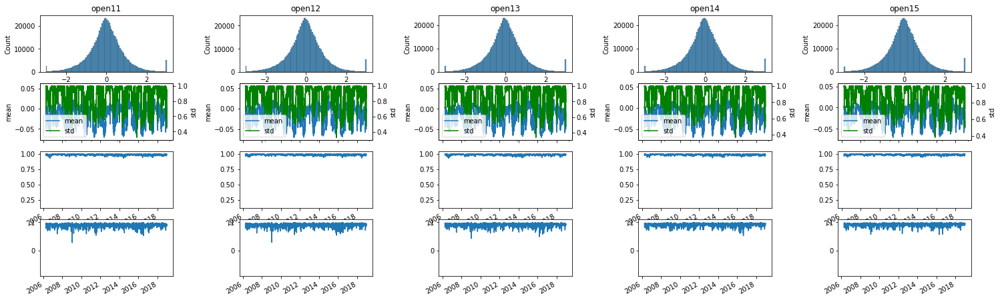

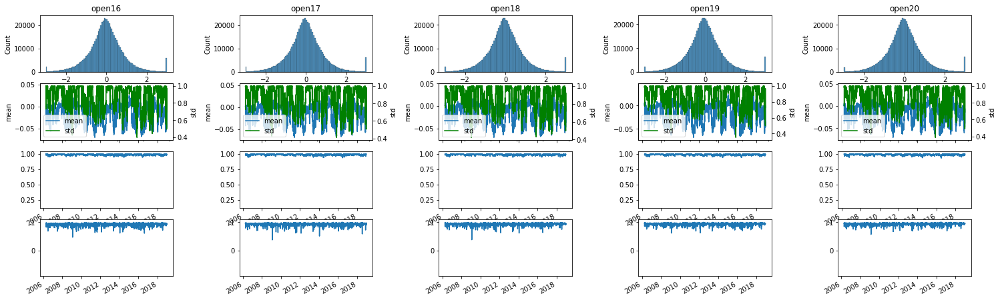

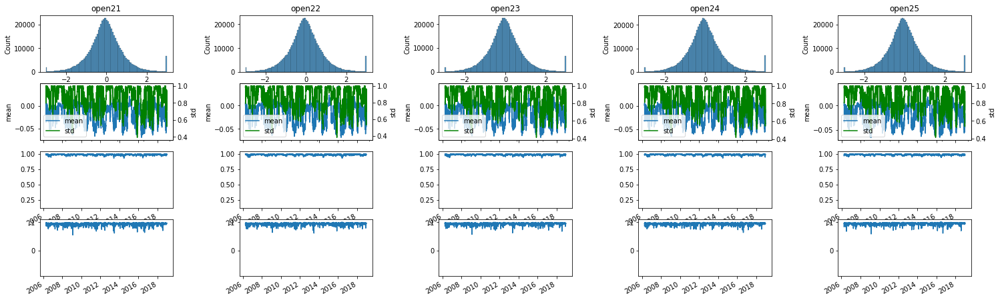

...

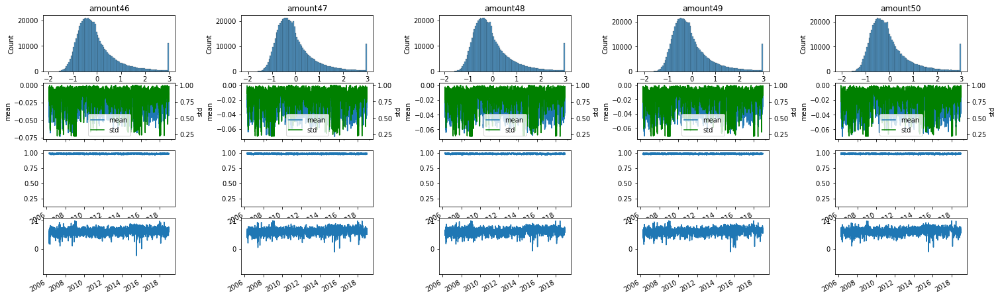

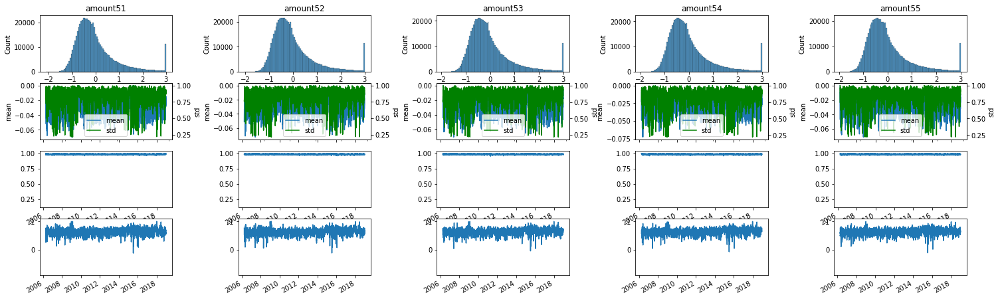

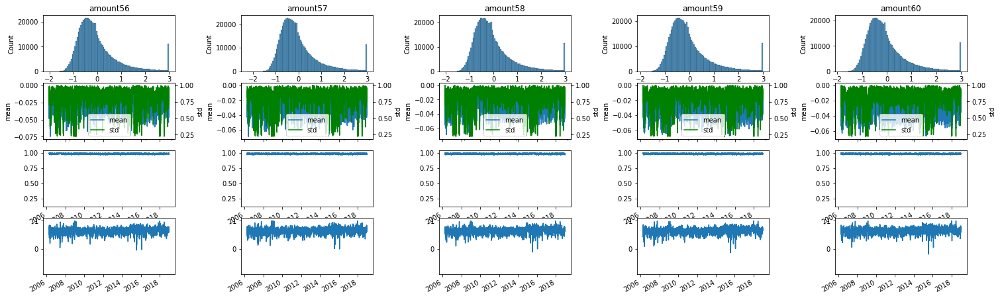

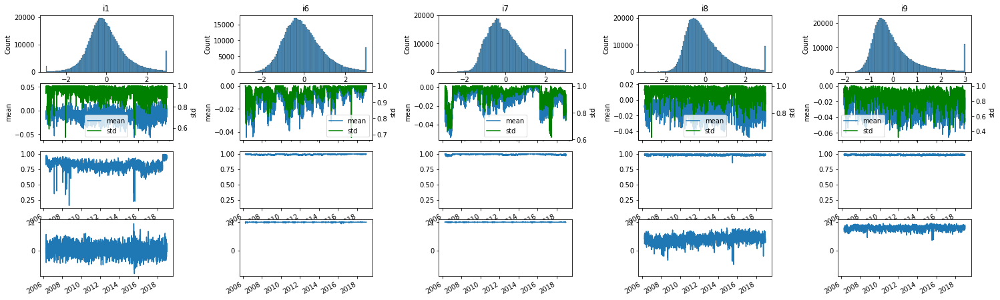

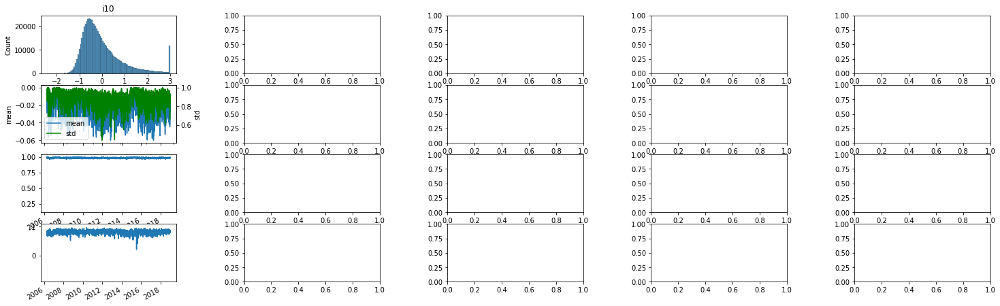

In [12]:
from functools import partial
from qlib.contrib.report.data.ana import CombFeaAna, FeaDistAna, FeaNanAnaRatio, FeaInfAna, FeaMeanStd, ValueCNT, FeaACAna, RawFeaAna

fa_full = CombFeaAna(X_train, FeaDistAna, FeaMeanStd, partial(ValueCNT, ratio=True), FeaACAna)
fa_full.plot_all(sub_fs=(5, 2), col_n=5, wspace=0.5)

因子性能分析: 下图统计了每个特征和Label和IC随时间如何变化 (moving average 100)  
因子性能随时间的变化非常剧烈(可能导致训练集、验证集和测试集上的结果有巨大差异)  
因子性能可能有周期性

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:   21.5s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   22.1s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:   31.3s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:   40.9s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:   49.6s
[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed:   58.8s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 113 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 149 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 189 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 210 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 233 tasks      | elapsed:  

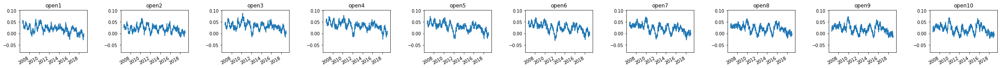

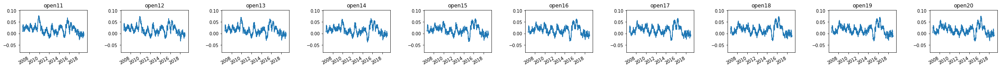

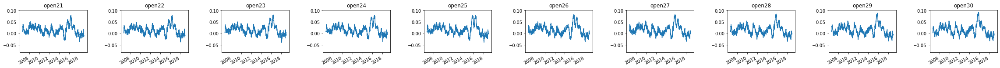

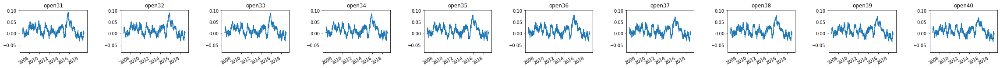

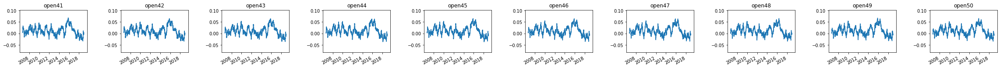

...

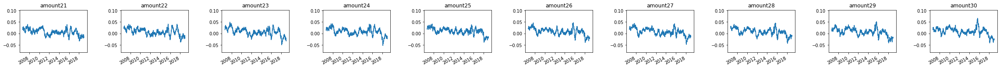

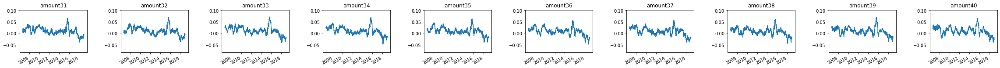

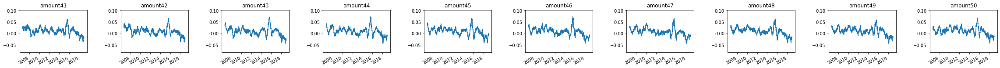

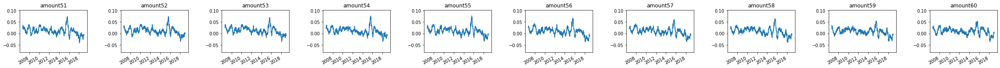

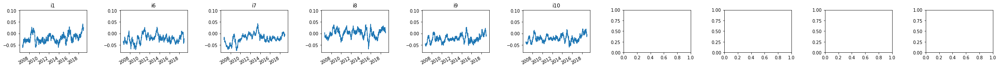

In [13]:
from qlib.contrib.eva.alpha import calc_all_ic
import pandas as pd

all_ic = calc_all_ic(X_train.to_dict('series'), y_train)
all_ic_df = pd.concat({f: d['ic'] for f, d in all_ic.items()})
all_ic_df = all_ic_df.unstack(0)

fa = RawFeaAna(all_ic_df.rolling(100).mean())
fa.plot_all(sub_fs=(4, 2), col_n=10, wspace=0.5)

<AxesSubplot:>

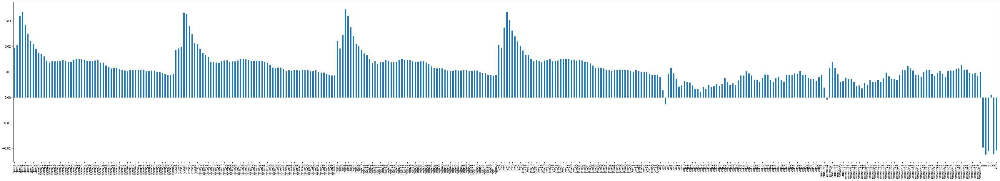

In [14]:
fig = all_ic_df.mean().plot(kind='bar', figsize=(60, 10))
fig

In [15]:
fig.figure.savefig("ic_mean")

原始数据的IC的均值，以及IC绝对值的均值

In [16]:
all_ic_df.mean().mean()

0.01166056277499556

In [17]:
abs(all_ic_df.mean()).mean()

0.012260875201080835

In [18]:
all_ic_df.mean()

open1    0.019366
open2    0.020450
open3    0.031985
open4    0.033408
open5    0.028552
           ...   
i6      -0.022418
i7      -0.021143
i8       0.001140
i9      -0.022260
i10     -0.020865
Length: 366, dtype: float64

ICIR

In [19]:
all_ic_df.mean() / all_ic_df.std()

open1    0.111068
open2    0.114592
open3    0.175563
open4    0.180798
open5    0.154143
           ...   
i6      -0.161016
i7      -0.189318
i8       0.006477
i9      -0.144614
i10     -0.138274
Length: 366, dtype: float64

分别对y_train, y_valid和y_test进行描述统计，看其分布以及分布之间的差异

In [20]:
y_train.describe()

count    604106.000000
mean         -0.007870
std           0.942260
min          -3.000000
25%          -0.582046
50%          -0.106060
75%           0.469364
max           3.000000
Name: label, dtype: float64

In [21]:
y_valid.describe()

count    258903.000000
mean         -0.006713
std           0.949267
min          -3.000000
25%          -0.586940
50%          -0.104639
75%           0.476558
max           3.000000
Name: label, dtype: float64

In [22]:
y_test.describe()

count    281840.000000
mean          0.000463
std           0.024988
min          -0.100000
25%          -0.012383
50%           0.000000
75%           0.011458
max           0.100000
Name: label, dtype: float64

使用pickle保存处理好的数据

In [23]:
import pickle

df_test = df[df.index.get_level_values(0) >= "2019-01-01"]
data_to_dump = {
    "X_train": X_train,
    "X_valid": X_valid,
    "X_test": X_test,
    "y_train": y_train,
    "y_valid": y_valid,
    "y_test": y_test,
    "y_mean": y_mean,
    "y_std": y_std,
    "df_test": df_test
}
for k in data_to_dump.keys():
    file = open(k + ".pkl", "wb")
    pickle.dump(data_to_dump[k], file)
    file.close()

拟合一个简单的模型看看效果

In [24]:
# 拟合模型
model = q.auto_lrg(X_train, y_train,  method='ols')

pred = model.predict(X_test)

pred = pd.DataFrame(pred, columns=["predict"], index=X_test.index)
pred["predict"] += y_mean
pred["predict"] *= y_std
pred.describe()

ols method will be used


,predict
count,281840.000000
mean,-0.000145
std,0.001340
min,-0.025339
25%,-0.000906
50%,-0.000093
75%,0.000660
max,0.010245


IC分析

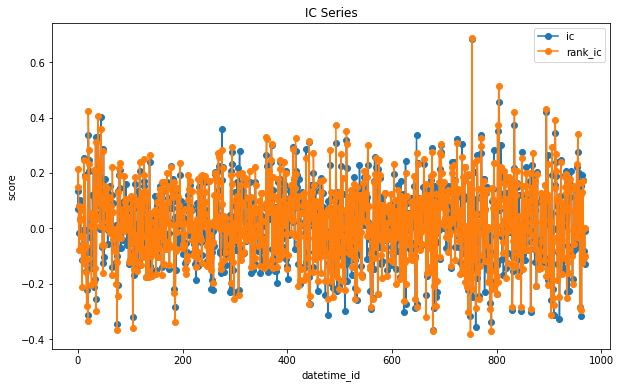

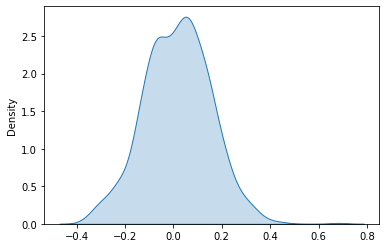

ic= 0.0156574026649153 icir= 0.11332234240311008 rank_ic= 0.020586569441688594 rank_icir= 0.14378857595647412


0.01388111072500458

In [25]:
ic, icir, rank_ic, rank_icir = q.ic_ana(pred["predict"], y_test, groupby='datetime')
print('ic=', ic, 'icir=', icir, 'rank_ic=', rank_ic, 'rank_icir=', rank_icir)
# 使用pearson相关系数评判拟合优度
r = q.pearson_corr(pred["predict"].values, y_test)
r

查看y_test和predict的分布和分布差异

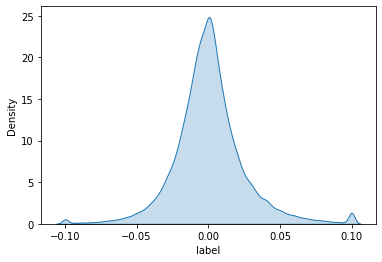

In [26]:
q.show_dist(y_test)

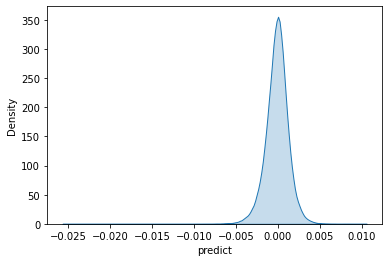

In [27]:
q.show_dist(pred["predict"])

回测

In [28]:
from scutquant import executor, report

# 将预测值处理成回测需要的格式
# pred = executor.prepare(pred, df_test, price='close', volume='vol')
pred = executor.prepare(pred, df_test, price='mean_price', volume='vol')
pred

predict       price     volume
time       code                                      
2019-01-02 000001.SZ  0.000336    9.252048  539386.32
           000002.SZ -0.001430   24.120738  247010.28
           000063.SZ -0.001433   19.088275  649682.72
           000069.SZ -0.000199    5.999183  403924.79
           000100.SZ -0.000883    2.515065  890514.27
...                        ...         ...        ...
2022-12-27 688363.SH -0.002175  136.312691   67620.51
           688396.SH  0.000173   53.127821   22894.05
           688561.SH -0.000122   65.791178   17585.16
           688599.SH -0.001855   62.192181  170829.80
           688981.SH -0.000331   41.078327   61293.26

[281386 rows x 3 columns]

Accuracy of Prediction: 0.5283347430220409


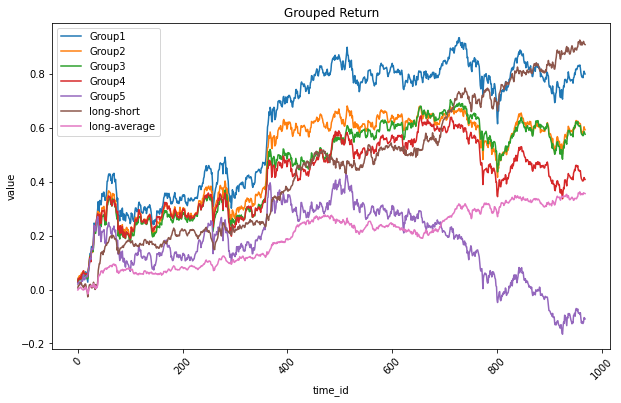

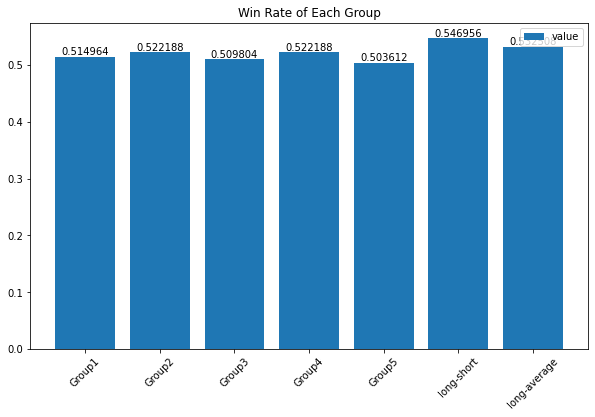

In [29]:
report.group_return_ana(pred, y_test)

In [30]:
backtest = {
    "generator": {
        "mode": "generate"
    },
    "strategy": {
        "class": "SigmaStrategy",  # 做多预测值前20%且值大于0%的股票, 做空后20%且值小于0%的股票. 自动平仓
        "kwargs": {
            "sigma": 1,
            "auto_offset": False,
            "offset_freq": 2, # 应为delta_t + 1, 例如目标值是close_-2 / close_-1 - 1, 则delta_t = 1
            "buy_only": False,  # =True时，只做多不做空(在A股做空有一定的难度)
            "short_volume": 5000,
            "risk_degree": 0.95,  # 将风险度控制在这个数，如果超过了就按比例减持股票直到风险度小于等于它为止
            "unit": None,  # 由于数据已经是以手为单位, 故无需二次处理
            "max_volume": 0.5  # 手数随可用资金而改变，最大不会超过股票当天成交量的x%(例如T+1时下单，下单手数不会超过T时成交量的x%)
        }
    },
    "account": None,  # 使用默认账户, 即初始资金为1亿, 无底仓
    "trade_params": {
        "cost_buy": 0.0015,  # 佣金加上印花税
        "cost_sell": 0.0005,  
        "min_cost": 5,
    }
}
generator, strategy, account, trade_params = backtest["generator"], backtest["strategy"], backtest["account"], backtest["trade_params"]
exe = executor.Executor(generator, strategy, account, trade_params)
exe.execute(data=pred, verbose=0)

Annualized Return: 0.11552759836343429
Annualized Volatility: 0.332080036555561
Annualized Return(Benchmark): 0.07899686073853784
Annualized Volatility(Benchmark): 0.3389941216655789 

Cumulative Rate of Return: 0.5225555001041242
Cumulative Rate of Return(Benchmark): 0.33958556303554865
Cumulative Excess Rate of Return: 0.18296993706857556 

Max Drawdown: -0.2161118347183617
Max Drawdown(Benchmark): -0.5462600364770351 

Sharpe Ratio: 2.5206683701487496
Sortino Ratio: 0.06444687461209479
Information Ratio: 0.07319145181128944 

Beta: 0.8879298341426395
Alpha: 0.05885436618788209
Epsilon: 0.07153005482874933
Profitable Days(%): 0.5706914344685242


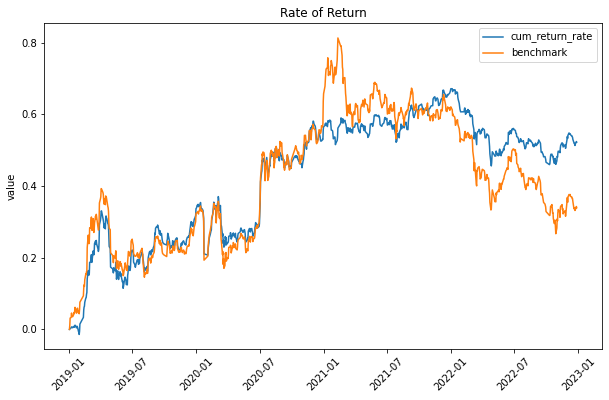

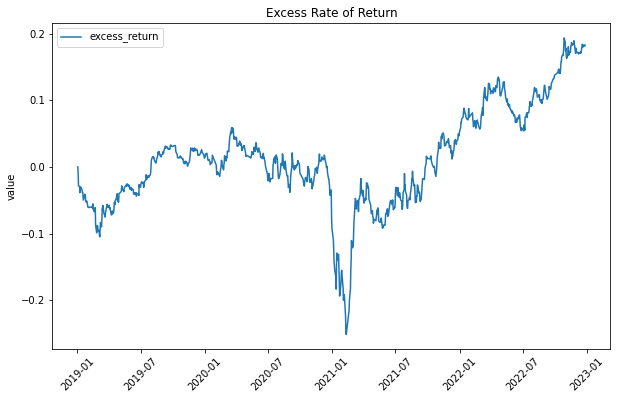

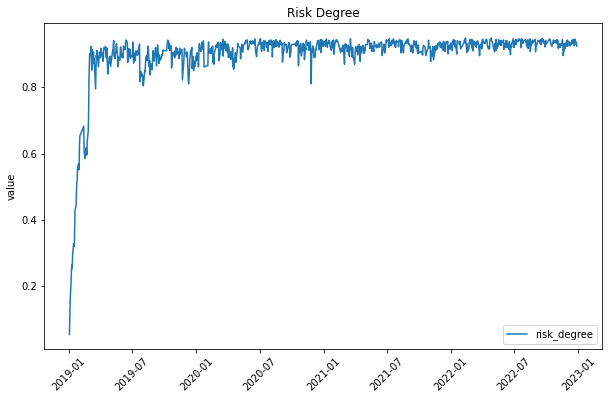

In [31]:
user_account, benchmark = exe.user_account, exe.benchmark
report.report_all(user_account, benchmark, freq=365, time=exe.time)  # 无风险收益率默认为年化3%，可以通过参数rf调节